In [50]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error



In [6]:
df= pd.read_csv("/GlobalLandTemperaturesByCountry.csv")

In [8]:
df.shape

(577462, 4)

In [9]:
df.head()

,dt,AverageTemperature,AverageTemperatureUncertainty,Country
0,1743-11-01,4.384,2.294,Åland
1,1743-12-01,NaN,NaN,Åland
2,1744-01-01,NaN,NaN,Åland
3,1744-02-01,NaN,NaN,Åland
4,1744-03-01,NaN,NaN,Åland


In [10]:
df.tail()

,dt,AverageTemperature,AverageTemperatureUncertainty,Country
577457,2013-05-01,19.059,1.022,Zimbabwe
577458,2013-06-01,17.613,0.473,Zimbabwe
577459,2013-07-01,17.000,0.453,Zimbabwe
577460,2013-08-01,19.759,0.717,Zimbabwe
577461,2013-09-01,NaN,NaN,Zimbabwe


In [11]:
df.isnull().sum()

dt                                   0
AverageTemperature               32651
AverageTemperatureUncertainty    31912
Country                              0
dtype: int64

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 577462 entries, 0 to 577461
Data columns (total 4 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   dt                             577462 non-null  object 
 1   AverageTemperature             544811 non-null  float64
 2   AverageTemperatureUncertainty  545550 non-null  float64
 3   Country                        577462 non-null  object 
dtypes: float64(2), object(2)
memory usage: 17.6+ MB


In [13]:
df.describe()

,AverageTemperature,AverageTemperatureUncertainty
count,544811.000000,545550.000000
mean,17.193354,1.019057
std,10.953966,1.201930
min,-37.658000,0.052000
25%,10.025000,0.323000
50%,20.901000,0.571000
75%,25.814000,1.206000
max,38.842000,15.003000


In [14]:
df.columns

Index(['dt', 'AverageTemperature', 'AverageTemperatureUncertainty', 'Country'], dtype='object')

In [15]:
df.sample()

,dt,AverageTemperature,AverageTemperatureUncertainty,Country
400185,1846-04-01,NaN,NaN,Palestina


In [16]:
pd.unique(df['AverageTemperature'])

array([ 4.384,    nan,  1.53 , ..., 22.645, 21.639, 23.529])

In [18]:
df[df['AverageTemperature'].isnull()]

,dt,AverageTemperature,AverageTemperatureUncertainty,Country
1,1743-12-01,NaN,NaN,Åland
2,1744-01-01,NaN,NaN,Åland
3,1744-02-01,NaN,NaN,Åland
4,1744-03-01,NaN,NaN,Åland
9,1744-08-01,NaN,NaN,Åland
...,...,...,...,...
575800,1875-04-01,NaN,NaN,Zimbabwe
575852,1879-08-01,NaN,NaN,Zimbabwe
575853,1879-09-01,NaN,NaN,Zimbabwe
575854,1879-10-01,NaN,NaN,Zimbabwe


In [19]:
df.loc[32651:576800,:]

,dt,AverageTemperature,AverageTemperatureUncertainty,Country
32651,1833-05-01,13.477,1.141,Asia
32652,1833-06-01,18.726,1.090,Asia
32653,1833-07-01,20.553,1.229,Asia
32654,1833-08-01,18.799,1.434,Asia
32655,1833-09-01,14.070,1.155,Asia
...,...,...,...,...
576796,1958-04-01,22.126,0.292,Zimbabwe
576797,1958-05-01,19.599,0.428,Zimbabwe
576798,1958-06-01,15.860,0.447,Zimbabwe
576799,1958-07-01,15.335,0.490,Zimbabwe


In [20]:
df = df.dropna()

In [21]:
df['dt'] = pd.to_datetime(df['dt']) 

In [22]:
df['year'] = df['dt']

In [23]:
df['AverageTemperature'].fillna('AverageTemperature',inplace=True)

In [24]:
df.isnull().sum()

dt                               0
AverageTemperature               0
AverageTemperatureUncertainty    0
Country                          0
year                             0
dtype: int64

In [25]:
df['AverageTemperatureUncertainty'].fillna('AverageTemperatureUncertainty ',inplace=True)

In [26]:
df.isnull().sum()

dt                               0
AverageTemperature               0
AverageTemperatureUncertainty    0
Country                          0
year                             0
dtype: int64

In [27]:
df['AverageTemperature'] = pd.to_numeric(df['AverageTemperature'], errors='coerce')


In [28]:
df = df.groupby(['dt','Country'])['AverageTemperature'].mean().reset_index()

In [29]:
top10hottest = df.groupby('Country')['AverageTemperature'].mean().nlargest(10).reset_index()

<ipython-input-30-84da957941fa>:2: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  graph = sns.kdeplot(df.AverageTemperature,color = 'blue',shade=True)


Text(0.5, 0, 'AverageTemperature')

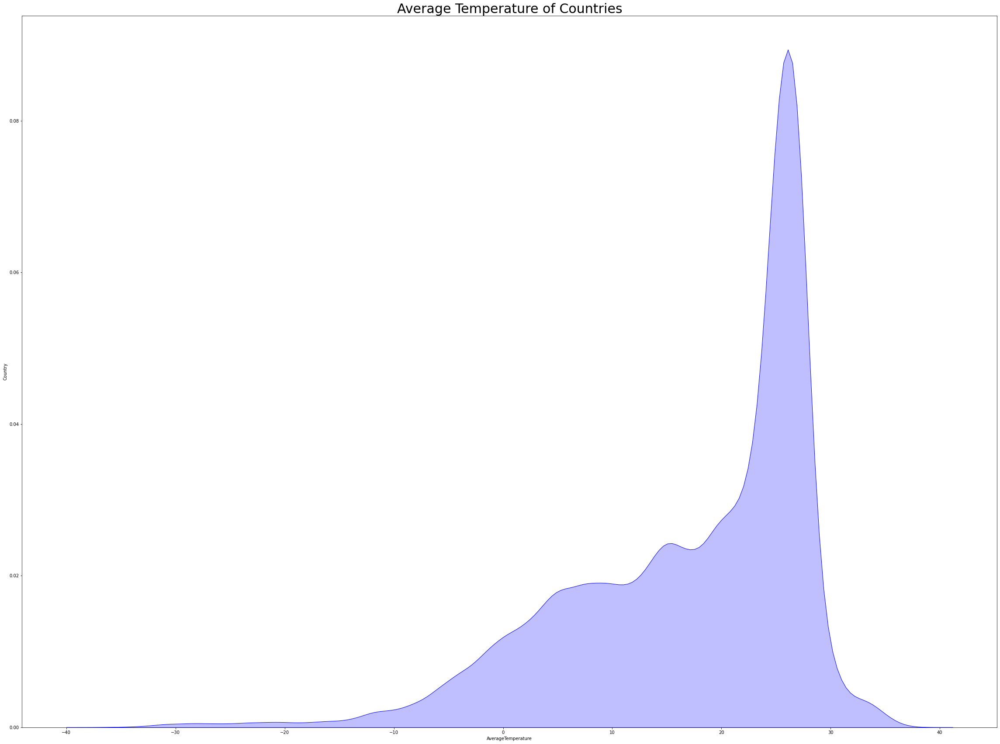

In [30]:
plt.figure(figsize=(40,30))
graph = sns.kdeplot(df.AverageTemperature,color = 'blue',shade=True)
plt.title('Average Temperature of Countries',size = 30)
plt.ylabel('Country')
plt.xlabel('AverageTemperature')

# Top ten hotest country


In [31]:
print(top10hottest)

                Country  AverageTemperature
0              Djibouti           28.816603
1                  Mali           28.441977
2          Burkina Faso           28.083507
3               Senegal           27.967375
4                 Aruba           27.920390
5  United Arab Emirates           27.693995
6            Mauritania           27.620256
7                Gambia           27.538552
8                 Niger           27.458973
9               Curaçao           27.353415


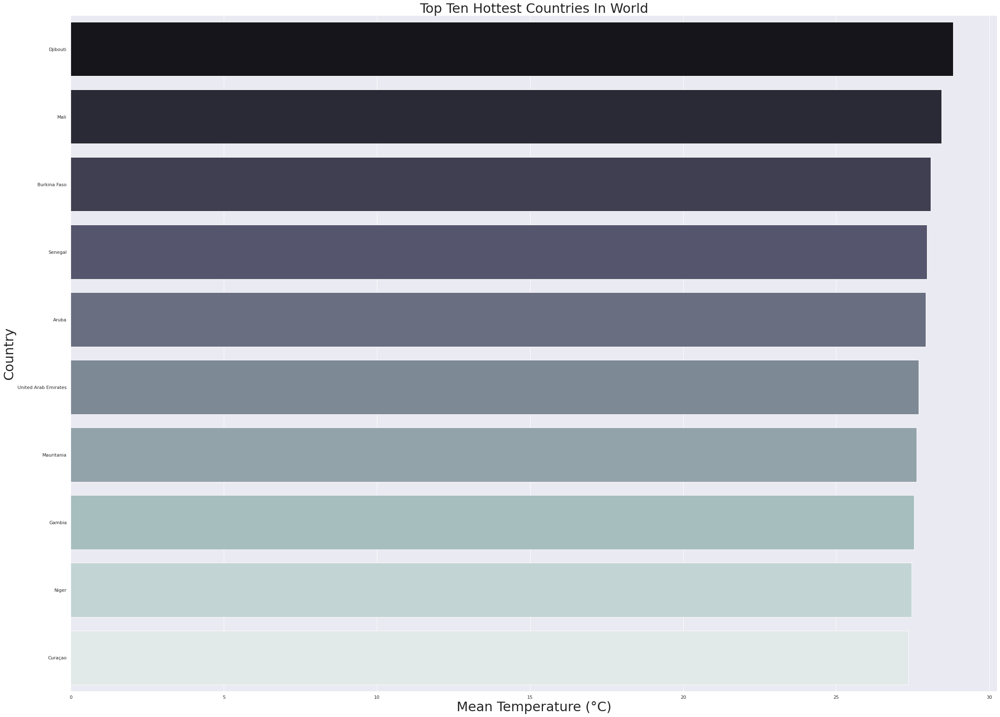

In [32]:
sns.set_style('darkgrid')
sns.set(rc = {'figure.figsize':(40,30)})
sns.barplot(x='AverageTemperature',y='Country',data=top10hottest,palette = 'bone')
plt.xlabel('Mean Temperature (°C)',fontsize = 32)
plt.ylabel('Country',fontsize = 32)
plt.title('Top Ten Hottest Countries In World',fontsize = 32)

plt.show()

/usr/local/lib/python3.9/dist-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


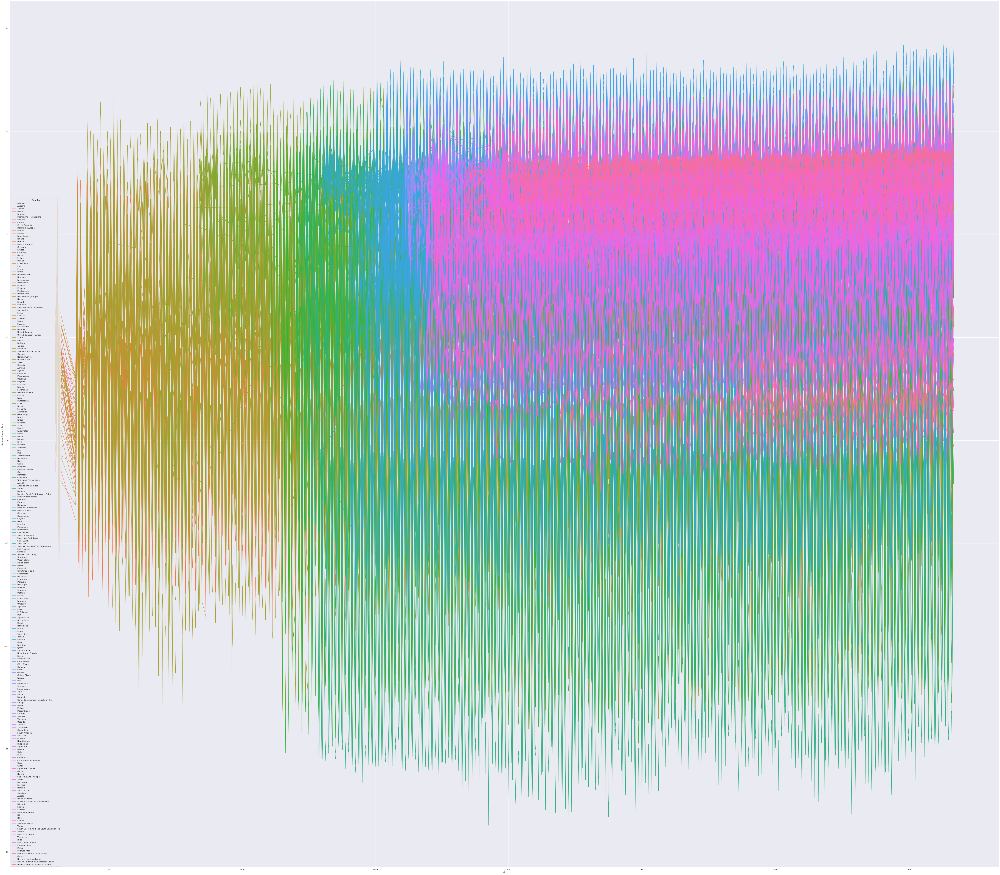

In [57]:
# def find_Top_10_Hottest(str):
#     top10=df[df['Country']==str]
#     top10Hot=top10.sort_values(by='AverageTemperature',ascending=False).head(10)
#     plt.figure(figsize=(25,20))
#     plt.title('Top 10 Hottest country',size=30);
#     graph=sns.barplot(x=top10Hot.Country, y =top10Hot.AVerageTemperature)
#     graph.set_xticklabels(graph.get_xticklabels(),rotation=45,horizontalalignment = 'right')
# top10 = df[df['Country'] == False]
# print(top10)
# top10Hottest=top10.sort_values(by = ['AverageTemperature'],ascending = False).head(5)
# print(top10Hottest)

sns.set(rc={'figure.figsize':(100,90)})
sns.lineplot(x='dt', y='AverageTemperature', hue='Country', data=df)
plt.show()

In [34]:
# find_Top_10_Hottest = top10Hottest[['Country','AverageTemperature']]

In [35]:
# plt.figure(figsize =(30,40));
# plt.xlabel('Country',size = 30)
# plt.ylabel('AverageTemperature',size=30)
# plt.bar(find_Top_10_Hottest.AverageTemperature,find_Top_10_Hottest.Country,width=1.2,labels = find_Top_10_Hottest.Country,autopct='%4.3f%%',strangle=30);
# plt.tick_params(rotation = 90)
# plt.title('find_Top_10_Hottest_country',size =15);


<Axes: xlabel='Country', ylabel='AverageTemperature'>

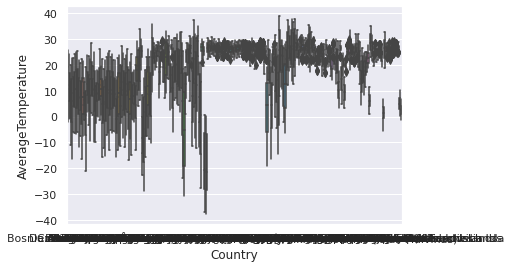

In [56]:
sns.boxplot(x = 'Country',y='AverageTemperature',data= df)

TypeError: ignored

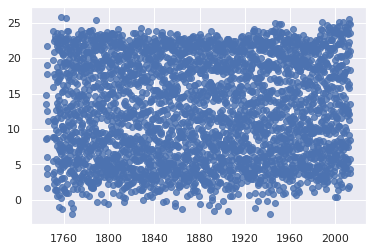

In [55]:
for country in df['Country'].unique():
    temp_df = df[df['Country']==country]
    sns.regplot(x='dt',y = 'AverageTemperature', data= temp_df, label = country)
plt.legend()
plt.show()

In [51]:
x= df[df['year']<=2000]
y= df[df['year']>2000]


In [52]:
climatemodel= LinearRegression()
climatemodel.fit(x[['year']],x[['AverageTemperature']])


LinearRegression()

In [53]:
climatepredictions = climatemodel.predict(y[['year']])
meansquarederror = mean_squared_error(y['AverageTemperature'],climatepredictions)
print('Mean Squared Test error: ', meansquarederror)

Mean Squared Test error:  112.28128440508637
